# Определение стоимости автомобилей

Сервис по продаже автомобилей с пробегом «Не бит, не крашен» разрабатывает приложение для привлечения новых клиентов. В нём можно быстро узнать рыночную стоимость своего автомобиля. В нашем распоряжении исторические данные: технические характеристики, комплектации и цены автомобилей. Нужно построить модель для определения стоимости. 

Заказчику важны:

- качество предсказания;
- скорость предсказания;
- время обучения.

Чтобы усилить исследование, не будем ограничиваться градиентным бустингом. Попробуем более простые модели — иногда они работают лучше. Эти редкие случаи легко пропустить, если всегда применять только бустинг. 
Поэкспериментируем и сравним характеристики моделей: время обучения, время предсказания, точность результата.

Данные находятся в файле "/datasets/autos.csv". **Описание данных:**

- DateCrawled — дата скачивания анкеты из базы
- VehicleType — тип автомобильного кузова
- RegistrationYear — год регистрации автомобиля
- Gearbox — тип коробки передач
- Power — мощность (л. с.)
- Model — модель автомобиля
- Kilometer — пробег (км)
- RegistrationMonth — месяц регистрации автомобиля
- FuelType — тип топлива
- Brand — марка автомобиля
- Repaired — была машина в ремонте или нет
- DateCreated — дата создания анкеты
- NumberOfPictures — количество фотографий автомобиля
- PostalCode — почтовый индекс владельца анкеты (пользователя)
- LastSeen — дата последней активности пользователя

**Целевой признак:**
- Price — цена (евро)

**Примечания:**

- Для оценки качества моделей применим метрику RMSE.
- Значение метрики RMSE должно быть меньше 2500

**План работы над задачей:**

1) **Загрузка и предобработка данных** — изучим данные на предмет возникновения в них дубликатов, аномалий, пропусков и ошибок в типах данных, а также обработаем все эти недостатки.

2) **Подготовка данных** — выполним подготовку признаков в пайплайне, избавимся от неинформативных признаков.

3) **Обучение моделей** — обучим модели DecisionTreeRegressor и LGBMRegressor и определим их лучшие гиперпараметры и показатели метрики RMSE.

4) На этапе **анализа моделей** определим время обучения и время предсказания моделей с лучшими гиперпараметрами.

5) Сделаем **итоговый вывод** об основных итогах исследования и предложим заказчику лучшую модель.

In [1]:
!pip install phik -q
!pip install scikit-learn==1.1.3 -q

import pandas as pd
import numpy as np
import seaborn as sb
import phik
import os
import re

from scipy import stats as st
from sklearn.model_selection import cross_val_score, RandomizedSearchCV, train_test_split 
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_squared_error 
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import (
    StandardScaler, OneHotEncoder, MinMaxScaler,
    OrdinalEncoder, LabelEncoder, RobustScaler
)

from lightgbm import LGBMRegressor

In [2]:
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import rcParams, rcParamsDefault
rcParams['figure.figsize'] = 10, 6
%config InlineBackend.figure_format = 'svg'
pd.set_option('display.max_columns', None)

In [3]:
def plot_describe (t, x_l, y_l): # Заранее пропишем функцию, подписывающую название графика и осей
    plt.title(t)                 # Здесь параметр t будет отвечать за название графика  
    plt.xlabel(x_l)              # Параметр x_l — за подпись горизонтальной оси
    plt.ylabel(y_l)              # Параметр y_l — за подпись вертикальной оси
    plt.show()

TEST_SIZE = 0.25
RANDOM_STATE = 42

## Загрузка и предобработка данных

Считаем csv-файл:

In [4]:
pth1 = 'C:/pr/datasets/autos.csv'
pth2 = '/datasets/autos.csv'

if os.path.exists(pth1):
    df = pd.read_csv(pth1, parse_dates=['DateCrawled', 'DateCreated', 'LastSeen'])
elif os.path.exists(pth2):
    df = pd.read_csv(pth2, parse_dates=['DateCrawled', 'DateCreated', 'LastSeen'])
else:
    print('Something is wrong')

Изучим общую информацию о датасете. Однако, прежде чем мы приступим к её разбору, напишем **вспомогательную функцию**. Так проводить анализ будет быстрее и удобнее:

In [5]:
def describe_data (data):
    print('Первые пять строк таблицы:')
    display(data.head())
    print('\n', 'Последние пять строк таблицы:')
    display(data.tail())
    print('\n', 'Общая информация о датасете:', '\n')
    display(data.info())
    print('\n', 'Описательные статистики датасета:')
    display(data.describe().round(2))
    print('\n', 'Количество дубликатов в данных:')
    display(data.duplicated().sum())

In [6]:
describe_data(df) # Изучаем данные о датасете

Первые пять строк таблицы:


,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
0,2016-03-24 11:52:17,480,NaN,1993,manual,0,golf,150000,0,petrol,volkswagen,NaN,2016-03-24,0,70435,2016-04-07 03:16:57
1,2016-03-24 10:58:45,18300,coupe,2011,manual,190,NaN,125000,5,gasoline,audi,yes,2016-03-24,0,66954,2016-04-07 01:46:50
2,2016-03-14 12:52:21,9800,suv,2004,auto,163,grand,125000,8,gasoline,jeep,NaN,2016-03-14,0,90480,2016-04-05 12:47:46
3,2016-03-17 16:54:04,1500,small,2001,manual,75,golf,150000,6,petrol,volkswagen,no,2016-03-17,0,91074,2016-03-17 17:40:17
4,2016-03-31 17:25:20,3600,small,2008,manual,69,fabia,90000,7,gasoline,skoda,no,2016-03-31,0,60437,2016-04-06 10:17:21



 Последние пять строк таблицы:


,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
354364,2016-03-21 09:50:58,0,NaN,2005,manual,0,colt,150000,7,petrol,mitsubishi,yes,2016-03-21,0,2694,2016-03-21 10:42:49
354365,2016-03-14 17:48:27,2200,NaN,2005,NaN,0,NaN,20000,1,NaN,sonstige_autos,NaN,2016-03-14,0,39576,2016-04-06 00:46:52
354366,2016-03-05 19:56:21,1199,convertible,2000,auto,101,fortwo,125000,3,petrol,smart,no,2016-03-05,0,26135,2016-03-11 18:17:12
354367,2016-03-19 18:57:12,9200,bus,1996,manual,102,transporter,150000,3,gasoline,volkswagen,no,2016-03-19,0,87439,2016-04-07 07:15:26
354368,2016-03-20 19:41:08,3400,wagon,2002,manual,100,golf,150000,6,gasoline,volkswagen,NaN,2016-03-20,0,40764,2016-03-24 12:45:21



 Общая информация о датасете: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   DateCrawled        354369 non-null  datetime64[ns]
 1   Price              354369 non-null  int64         
 2   VehicleType        316879 non-null  object        
 3   RegistrationYear   354369 non-null  int64         
 4   Gearbox            334536 non-null  object        
 5   Power              354369 non-null  int64         
 6   Model              334664 non-null  object        
 7   Kilometer          354369 non-null  int64         
 8   RegistrationMonth  354369 non-null  int64         
 9   FuelType           321474 non-null  object        
 10  Brand              354369 non-null  object        
 11  Repaired           283215 non-null  object        
 12  DateCreated        354369 non-null  datetime64[ns]
 13  NumberOfPic

None


 Описательные статистики датасета:


,Price,RegistrationYear,Power,Kilometer,RegistrationMonth,NumberOfPictures,PostalCode
count,354369.00,354369.00,354369.00,354369.00,354369.00,354369.0,354369.00
mean,4416.66,2004.23,110.09,128211.17,5.71,0.0,50508.69
std,4514.16,90.23,189.85,37905.34,3.73,0.0,25783.10
min,0.00,1000.00,0.00,5000.00,0.00,0.0,1067.00
25%,1050.00,1999.00,69.00,125000.00,3.00,0.0,30165.00
50%,2700.00,2003.00,105.00,150000.00,6.00,0.0,49413.00
75%,6400.00,2008.00,143.00,150000.00,9.00,0.0,71083.00
max,20000.00,9999.00,20000.00,150000.00,12.00,0.0,99998.00



 Количество дубликатов в данных:


4

Оптимизируем типы данных:

In [7]:
def optimize_memory_usage(df: pd.DataFrame, print_size: bool=True) -> pd.DataFrame:
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    before_size = df.memory_usage().sum() / 1024**2  # Размер занимаемой памяти до оптимизации (в Мб)
    for column in df.columns:
        column_type = df[column].dtypes
        if column_type in numerics:
            column_min = df[column].min()
            column_max = df[column].max()
            if str(column_type).startswith('int'):
                if column_min > np.iinfo(np.int8).min and column_max < np.iinfo(np.int8).max:
                    df[column] = df[column].astype(np.int8)
                elif column_min > np.iinfo(np.int16).min and column_max < np.iinfo(np.int16).max:
                    df[column] = df[column].astype(np.int16)
                elif column_min > np.iinfo(np.int32).min and column_max < np.iinfo(np.int32).max:
                    df[column] = df[column].astype(np.int32)
                elif column_min > np.iinfo(np.int64).min and column_max < np.iinfo(np.int64).max:
                    df[column] = df[column].astype(np.int64)  
            else:
                if column_min > np.finfo(np.float32).min and column_max < np.finfo(np.float32).max:
                    df[column] = df[column].astype(np.float32)
                else:
                    df[column] = df[column].astype(np.float64)    
    after_size = df.memory_usage().sum() / 1024**2  # Размер занимаемой памяти после оптимизации (в Мб)
    if print_size: print('Размер использования памяти: до {:5.2f} Mb - после {:5.2f} Mb ({:.1f}%)'
                         .format(before_size, after_size, 100 * (before_size - after_size) / before_size))
    return df

df = optimize_memory_usage(df)

Размер использования памяти: до 43.26 Mb - после 29.74 Mb (31.2%)


In [8]:
df.info() # Ознакомимся с конечными типами данных

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   DateCrawled        354369 non-null  datetime64[ns]
 1   Price              354369 non-null  int16         
 2   VehicleType        316879 non-null  object        
 3   RegistrationYear   354369 non-null  int16         
 4   Gearbox            334536 non-null  object        
 5   Power              354369 non-null  int16         
 6   Model              334664 non-null  object        
 7   Kilometer          354369 non-null  int32         
 8   RegistrationMonth  354369 non-null  int8          
 9   FuelType           321474 non-null  object        
 10  Brand              354369 non-null  object        
 11  Repaired           283215 non-null  object        
 12  DateCreated        354369 non-null  datetime64[ns]
 13  NumberOfPictures   354369 non-null  int8    

In [9]:
df.isna().sum().sort_values(ascending=False) # Найдём количество пропусков в каждом столбце

Repaired             71154
VehicleType          37490
FuelType             32895
Gearbox              19833
Model                19705
DateCrawled              0
Price                    0
RegistrationYear         0
Power                    0
Kilometer                0
RegistrationMonth        0
Brand                    0
DateCreated              0
NumberOfPictures         0
PostalCode               0
LastSeen                 0
dtype: int64

**На данном этапе можем выделить следующие проблемы:**

- в данных очень много пропусков;
- допущены стилистические ошибки в названиях столбцов;
- обнаружены и удалены очевидные дубликаты в данных;
- возможны неочевидные дубликаты, требующие более тщательной проверки.

## Исследовательский анализ

Для начала приведём названия столбцов к "змеиному" регистру:

In [10]:
def to_snake_case(column): # Напишем функцию, которая будет приводить названия столбцов к snake_case
    column = re.sub(r'(?<!^)(?=[A-Z])', '_', column).lower()
    return column

df.columns = [to_snake_case(col) for col in df.columns] # Применим функцию к столбцам датасета
df.head() # Проверим корректность замены названий столбцов

,date_crawled,price,vehicle_type,registration_year,gearbox,power,model,kilometer,registration_month,fuel_type,brand,repaired,date_created,number_of_pictures,postal_code,last_seen
0,2016-03-24 11:52:17,480,NaN,1993,manual,0,golf,150000,0,petrol,volkswagen,NaN,2016-03-24,0,70435,2016-04-07 03:16:57
1,2016-03-24 10:58:45,18300,coupe,2011,manual,190,NaN,125000,5,gasoline,audi,yes,2016-03-24,0,66954,2016-04-07 01:46:50
2,2016-03-14 12:52:21,9800,suv,2004,auto,163,grand,125000,8,gasoline,jeep,NaN,2016-03-14,0,90480,2016-04-05 12:47:46
3,2016-03-17 16:54:04,1500,small,2001,manual,75,golf,150000,6,petrol,volkswagen,no,2016-03-17,0,91074,2016-03-17 17:40:17
4,2016-03-31 17:25:20,3600,small,2008,manual,69,fabia,90000,7,gasoline,skoda,no,2016-03-31,0,60437,2016-04-06 10:17:21


Также сразу разберёмся с неявными дубликатами. Данные выведем в словарь, в котором ключ будет представлять собой название столбца, а значение — список его уникальных значений:

In [11]:
[{i: df[i].unique()} for i in df.columns if df[i].dtype == 'object']

[{'vehicle_type': array([nan, 'coupe', 'suv', 'small', 'sedan', 'convertible', 'bus',
         'wagon', 'other'], dtype=object)},
 {'gearbox': array(['manual', 'auto', nan], dtype=object)},
 {'model': array(['golf', nan, 'grand', 'fabia', '3er', '2_reihe', 'other', 'c_max',
         '3_reihe', 'passat', 'navara', 'ka', 'polo', 'twingo', 'a_klasse',
         'scirocco', '5er', 'meriva', 'arosa', 'c4', 'civic', 'transporter',
         'punto', 'e_klasse', 'clio', 'kadett', 'kangoo', 'corsa', 'one',
         'fortwo', '1er', 'b_klasse', 'signum', 'astra', 'a8', 'jetta',
         'fiesta', 'c_klasse', 'micra', 'vito', 'sprinter', '156', 'escort',
         'forester', 'xc_reihe', 'scenic', 'a4', 'a1', 'insignia', 'combo',
         'focus', 'tt', 'a6', 'jazz', 'omega', 'slk', '7er', '80', '147',
         '100', 'z_reihe', 'sportage', 'sorento', 'v40', 'ibiza', 'mustang',
         'eos', 'touran', 'getz', 'a3', 'almera', 'megane', 'lupo', 'r19',
         'zafira', 'caddy', 'mondeo', 'cordoba'

Неочевидных дубликатов нет, однако в столбце с данными о типах топлива смущают значения 'petrol' и 'gasoline', так как это просто два разных названия одного и того же типа. Оставим более распространённый 'gasoline':

In [12]:
df.loc[df['fuel_type'] == 'petrol', 'fuel_type'] = 'gasoline'
df.head()

,date_crawled,price,vehicle_type,registration_year,gearbox,power,model,kilometer,registration_month,fuel_type,brand,repaired,date_created,number_of_pictures,postal_code,last_seen
0,2016-03-24 11:52:17,480,NaN,1993,manual,0,golf,150000,0,gasoline,volkswagen,NaN,2016-03-24,0,70435,2016-04-07 03:16:57
1,2016-03-24 10:58:45,18300,coupe,2011,manual,190,NaN,125000,5,gasoline,audi,yes,2016-03-24,0,66954,2016-04-07 01:46:50
2,2016-03-14 12:52:21,9800,suv,2004,auto,163,grand,125000,8,gasoline,jeep,NaN,2016-03-14,0,90480,2016-04-05 12:47:46
3,2016-03-17 16:54:04,1500,small,2001,manual,75,golf,150000,6,gasoline,volkswagen,no,2016-03-17,0,91074,2016-03-17 17:40:17
4,2016-03-31 17:25:20,3600,small,2008,manual,69,fabia,90000,7,gasoline,skoda,no,2016-03-31,0,60437,2016-04-06 10:17:21


Далее более детально изучим каждый из признаков. Начнём с количественных: 

### Количественные признаки

Для каждого из количественных признаков построим гистограмму (либо же столбчатую диаграмму для дискретных признаков) и диаграмму размаха, а также изучим влияние данного признака на целевой.

Данные разобьём на две подвыборки (там, где это возможно) — машины, стоимость которых выше медианной и ниже. Это может помочь нам лучше понять влияние различных факторов на формирование целевого признака. К тому же, такое разбиение выглядит более адекватным ввиду того, что медианное значение менее чувствительно к выбросам (которые можно увидеть даже невооружённым глазом уже на этапе загрузки данных).

In [13]:
df['price'].median() # Находим медианное значение целевого признака

2700.0

#### Признак `price`

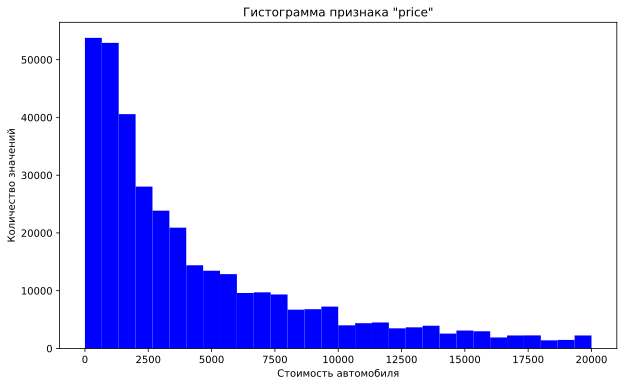

In [14]:
plt.hist(df['price'], bins=30, color='blue')
plot_describe('Гистограмма признака "price"',
              'Стоимость автомобиля', 'Количество значений')

In [15]:
plt.boxplot(df['price'])
plot_describe('Диаграмма размаха признака "price"', '',
              'Стоимость автомобилей')

Выбросы  в верхнем диапазоне диаграммы размаха вполне объяснимы: это могут быть "раритетные" или же просто премиальные автомобили. Однако, слишком низкая стоимость (вплоть до 0 евро) смущает даже больше. Ограничим стоимость автомобилей минимальным порогом в 50 евро — в такое, пусть и маленькое, число хотя бы можно поверить:

In [16]:
df = df[df['price'] >= 50]

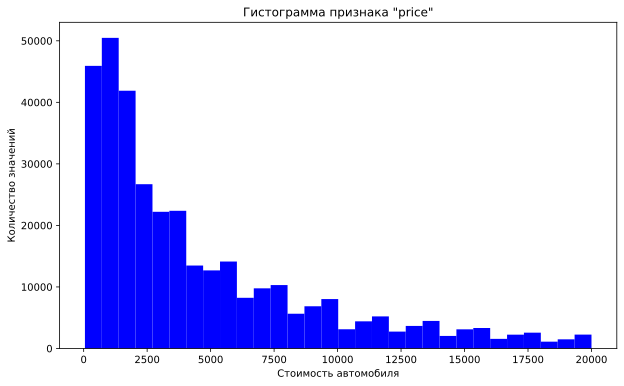

In [17]:
plt.hist(df['price'], bins=30, color='blue')
plot_describe('Гистограмма признака "price"',
              'Стоимость автомобиля', 'Количество значений')

In [18]:
plt.boxplot(df['price'])
plot_describe('Диаграмма размаха признака "price"', '',
              'Стоимость автомобилей')

#### Признак `registration_year`

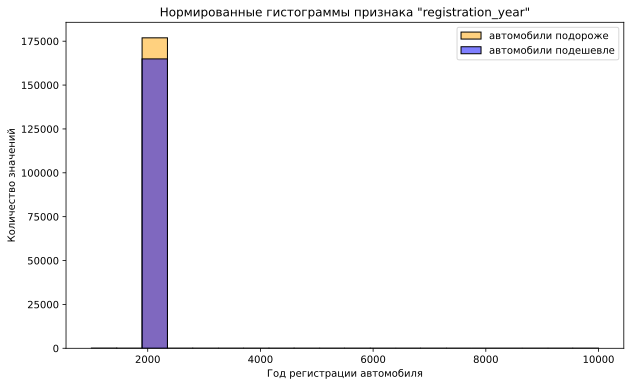

In [19]:
sb.histplot(df.loc[df['price'] > 2700]['registration_year'],
        stat='count', bins=20, common_norm=False, alpha=0.5, color='orange', label='автомобили подороже')
sb.histplot(df.loc[df['price'] <= 2700]['registration_year'],
        stat='count', bins=20, common_norm=False, alpha=0.5, color='blue', label='автомобили подешевле')
plt.legend(loc='upper right')
plot_describe('Нормированные гистограммы признака "registration_year"',
              'Год регистрации автомобиля', 'Количество значений')

In [20]:
plt.boxplot([df.loc[df['price'] > 2700]['registration_year'], 
            df.loc[df['price'] <= 2700]['registration_year']])
plt.xticks([1, 2], ['автомобили подороже', 'автомобили подешевле'])
plot_describe('Диаграммы размаха признака "registration_year"', '',
              'Год регистрации автомобиля')

Налицо внушительное количество выбросов. Попробуем для начала отсеять наиболее нереалистичные:

In [21]:
display(df['date_crawled'].min()) # Найдём самую раннюю и позднюю даты скачивания анкеты из базы
display(df['date_crawled'].max())

Timestamp('2016-03-05 14:06:22')

Timestamp('2016-04-07 14:36:58')

Судя по всему, выгрузка данных происходила в 2016 году, поэтому имеет смысл удалить строки с годом регистрации после 2016. Также есть аномальные значения до 1900-ых годов — от них также избавимся:

In [22]:
df = df[(df['registration_year'] >= 1900) & (df['registration_year'] <= 2016)]

Посмотрим на то, как изменятся гистограммы и диаграммы размаха с учётом новых значений:

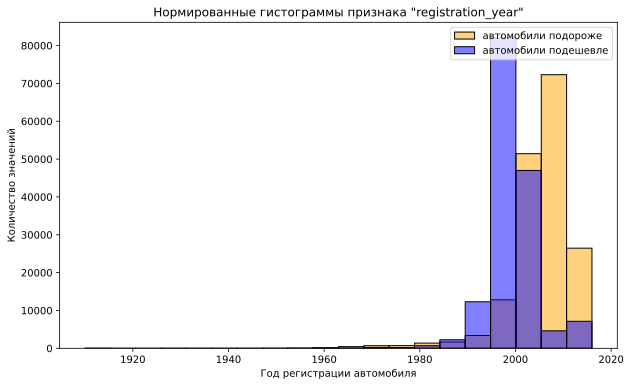

In [23]:
sb.histplot(df.loc[df['price'] > 2700]['registration_year'],
        stat='count', bins=20, common_norm=False, alpha=0.5, color='orange', label='автомобили подороже')
sb.histplot(df.loc[df['price'] <= 2700]['registration_year'],
        stat='count', bins=20, common_norm=False, alpha=0.5, color='blue', label='автомобили подешевле')
plt.legend(loc='upper right')
plot_describe('Нормированные гистограммы признака "registration_year"',
              'Год регистрации автомобиля', 'Количество значений')

In [24]:
plt.boxplot([df.loc[df['price'] > 2700]['registration_year'], 
            df.loc[df['price'] <= 2700]['registration_year']])
plt.xticks([1, 2], ['автомобили подороже', 'автомобили подешевле'])
plot_describe('Диаграммы размаха признака "registration_year"', '',
              'Год регистрации автомобиля')

In [25]:
print(f'Количество строк с выбросами: {len(df.query("registration_year < 1990"))}')
print(f'Доля выбросов в масштабах датасета: {round(len(df.query("registration_year < 1990")) / len(df) * 100, 1)}%')

Количество строк с выбросами: 8731
Доля выбросов в масштабах датасета: 2.7%


На этот раз графики хотя бы различимы, но пока что далеки от идеала. Тем не менее, избавляться от выбросов и дальше не вижу смысла, так как, во-первых, "раритетные" автомобили имеют право на существование, а во-вторых, доля их в общем количестве данных невысока. 

#### Признак `power`

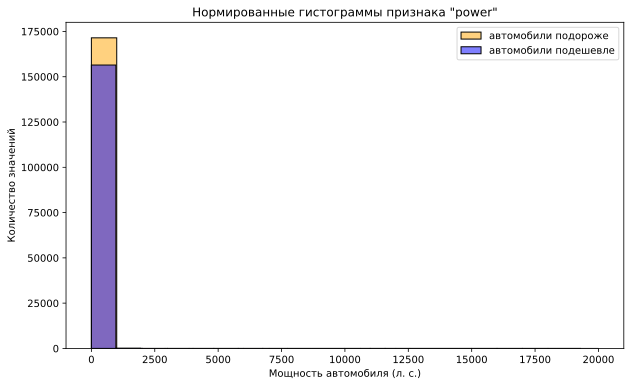

In [26]:
sb.histplot(df.loc[df['price'] > 2700]['power'],
        stat='count', bins=20, common_norm=False, alpha=0.5, color='orange', label='автомобили подороже')
sb.histplot(df.loc[df['price'] <= 2700]['power'],
        stat='count', bins=20, common_norm=False, alpha=0.5, color='blue', label='автомобили подешевле')
plt.legend(loc='upper right')
plot_describe('Нормированные гистограммы признака "power"',
              'Мощность автомобиля (л. с.)', 'Количество значений')

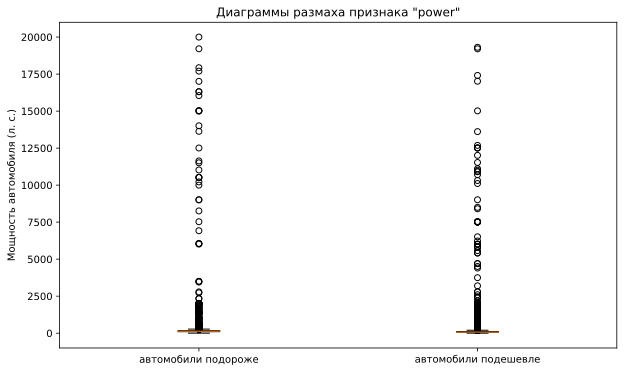

In [27]:
plt.boxplot([df.loc[df['price'] > 2700]['power'], 
            df.loc[df['price'] <= 2700]['power']])
plt.xticks([1, 2], ['автомобили подороже', 'автомобили подешевле'])
plot_describe('Диаграммы размаха признака "power"', '',
              'Мощность автомобиля (л. с.)')

И снова графики сложно различить из-за выбросов. Попробуем разобраться с большинством из них, руководствуясь здравым смыслом. А именно:

In [28]:
df = df[df['power'] <= 600] # В 2016 году мощность премиальных автомобилей могла достигать 600 л.с. 
df = df[df['power'] >= 40] # Слишком маленькие значения также маловероятны

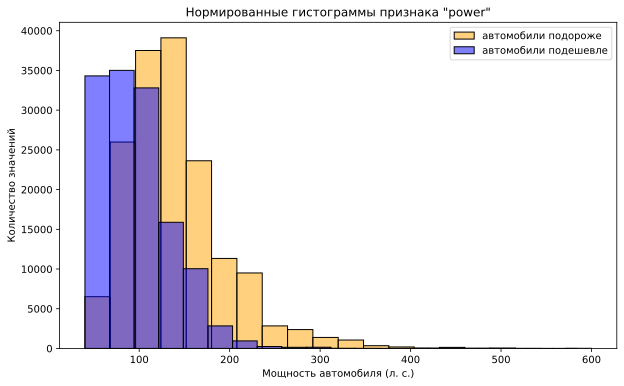

In [29]:
sb.histplot(df.loc[df['price'] > 2700]['power'],
        stat='count', bins=20, common_norm=False, alpha=0.5, color='orange', label='автомобили подороже')
sb.histplot(df.loc[df['price'] <= 2700]['power'],
        stat='count', bins=20, common_norm=False, alpha=0.5, color='blue', label='автомобили подешевле')
plt.legend(loc='upper right')
plot_describe('Нормированные гистограммы признака "power"',
              'Мощность автомобиля (л. с.)', 'Количество значений')

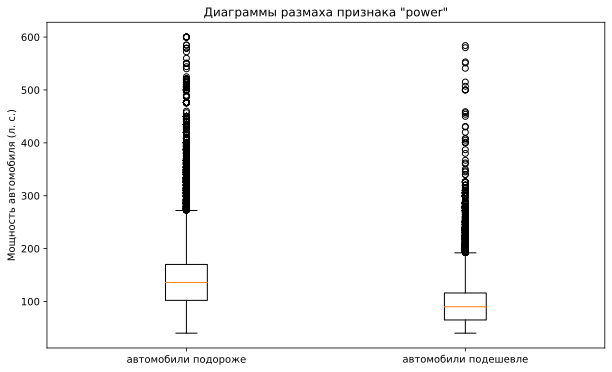

In [30]:
plt.boxplot([df.loc[df['price'] > 2700]['power'], 
            df.loc[df['price'] <= 2700]['power']])
plt.xticks([1, 2], ['автомобили подороже', 'автомобили подешевле'])
plot_describe('Диаграммы размаха признака "power"', '',
              'Мощность автомобиля (л. с.)')

In [31]:
print(f'Количество строк с выбросами: {len(df.query("power > 280"))}')
print(f'Доля выбросов в масштабах датасета: {round(len(df.query("power > 280")) / len(df) * 100, 1)}%')

Количество строк с выбросами: 4109
Доля выбросов в масштабах датасета: 1.4%


Да, номинально выбросы остались, но их количество вновь мало и объяснимо: вероятно, это автомобили премиального сегмента.

#### Признак `kilometer`

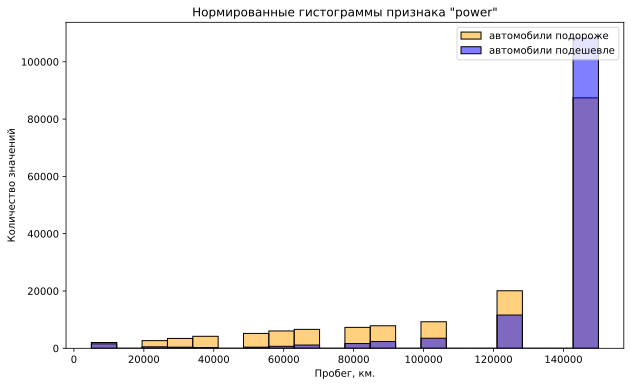

In [32]:
sb.histplot(df.loc[df['price'] > 2700]['kilometer'],
        stat='count', bins=20, common_norm=False, alpha=0.5, color='orange', label='автомобили подороже')
sb.histplot(df.loc[df['price'] <= 2700]['kilometer'],
        stat='count', bins=20, common_norm=False, alpha=0.5, color='blue', label='автомобили подешевле')
plt.legend(loc='upper right')
plot_describe('Нормированные гистограммы признака "power"',
              'Пробег, км.', 'Количество значений')

In [33]:
plt.boxplot([df.loc[df['price'] > 2700]['kilometer'], 
            df.loc[df['price'] <= 2700]['kilometer']])
plt.xticks([1, 2], ['автомобили подороже', 'автомобили подешевле'])
plot_describe('Диаграммы размаха признака "power"', '',
              'Пробег, км.')

На этот раз наблюдаем выбросы среди категории дешёвых автомобилей — для них пробег менее 150000 км. скорее редкость, что объяснимо — это один из факторов, влияющих на снижение цены автомобиля.

### Категориальные признаки

Для категориальных признаков целесообразнее построить круговую диаграмму, показывающую соотношение между различными категориями. Однако у нас в данных довольно много пропусков, и все из них — в столбцах с категориальными признаками. И, так как однозначно судить о причинах, по которым эти пропуски возникли, мы не можем — наилучшим методом будет заменить эти пропуски "заглушкой" 'unknown':

In [34]:
missing_rows = ['repaired', 'model', 'vehicle_type', 'fuel_type', 'gearbox']

# Заполняем пропущенные значения
for row in missing_rows:
    df[row].fillna('unknown', inplace=True)
    print(f'Количество пропусков в столбце {row}: {df[row].isna().sum()}')

Количество пропусков в столбце repaired: 0
Количество пропусков в столбце model: 0
Количество пропусков в столбце vehicle_type: 0
Количество пропусков в столбце fuel_type: 0
Количество пропусков в столбце gearbox: 0


#### Признак `vehicle_type`

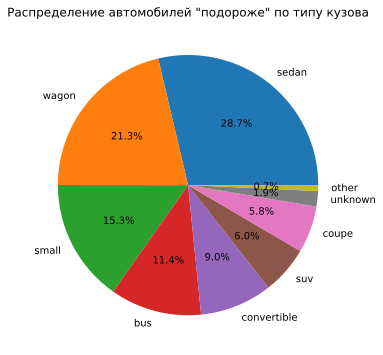

In [35]:
(df.loc[df['price'] > 2700]['vehicle_type']
    .value_counts().plot(y='count', kind='pie', autopct='%1.1f%%', ylabel=''))
plt.title('Распределение автомобилей "подороже" по типу кузова')
plt.show()

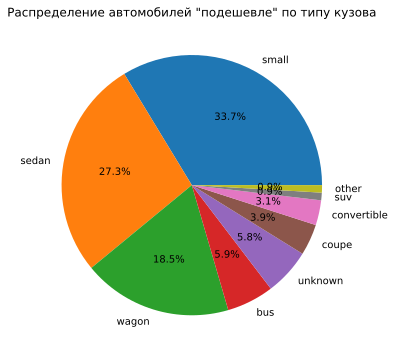

In [36]:
(df.loc[df['price'] <= 2700]['vehicle_type']
    .value_counts().plot(y='count', kind='pie', autopct='%1.1f%%', ylabel=''))
plt.title('Распределение автомобилей "подешевле" по типу кузова')
plt.show()

Заметны различия в ценовых группах:
- у автомобилей подешевле преобладают маленькие кузовы, следом за ними идут кузовы типа "седан" и "фургон";
- у автомобилей подороже же наоборот — кузовы типа "седан" и "фургон" наиболее распространены, а замыкают тройку лидеров как раз-таки маленькие кузовы.

#### Признак `gearbox`

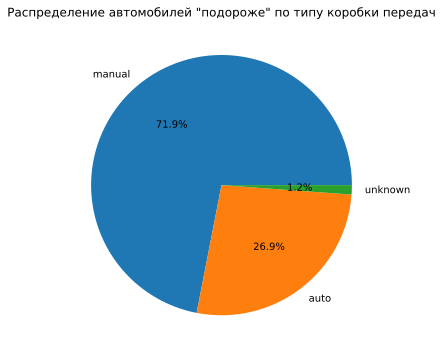

In [37]:
(df.loc[df['price'] > 2700]['gearbox']
    .value_counts().plot(y='count', kind='pie', autopct='%1.1f%%', ylabel=''))
plt.title('Распределение автомобилей "подороже" по типу коробки передач')
plt.show()

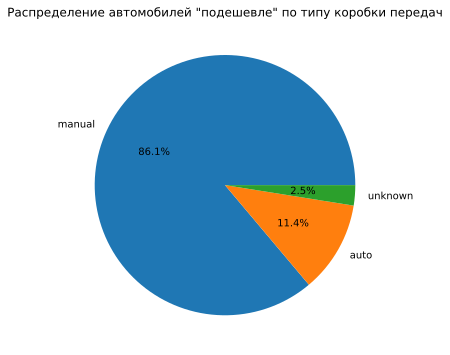

In [38]:
(df.loc[df['price'] <= 2700]['gearbox']
    .value_counts().plot(y='count', kind='pie', autopct='%1.1f%%', ylabel=''))
plt.title('Распределение автомобилей "подешевле" по типу коробки передач')
plt.show()

В обоих случаях преобладают автомобили с ручной коробкой передач, однако среди автомобилей верхнего ценового сегмента почти вдвое больший процент машин с автоматической коробкой, чем среди сегмента нижнего.

#### Признак `repaired`

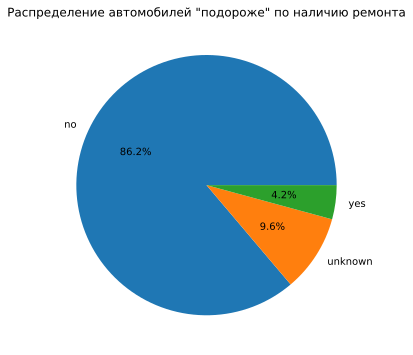

In [39]:
(df.loc[df['price'] > 2700]['repaired']
    .value_counts().plot(y='count', kind='pie', autopct='%1.1f%%', ylabel=''))
plt.title('Распределение автомобилей "подороже" по наличию ремонта')
plt.show()

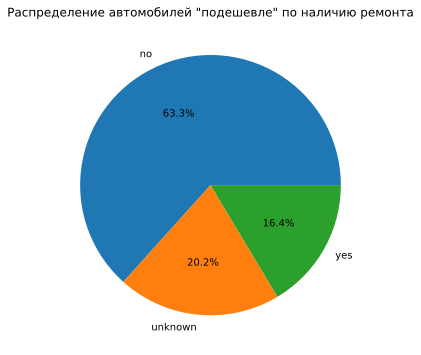

In [40]:
(df.loc[df['price'] <= 2700]['repaired']
    .value_counts().plot(y='count', kind='pie', autopct='%1.1f%%', ylabel=''))
plt.title('Распределение автомобилей "подешевле" по наличию ремонта')
plt.show()

Можем заметить, что в высшем ценовом сегменте подавляющее большинство автомобилей не были в ремонте, в то время как в низшем велика доля как тех машин, что в ремонте были, так и тех, данных о ремонте которых нет вовсе (вероятно, продавцы, размещавшие объявления, осознанно не указывали данные о том, что их машина была в ремонте, чтобы тем самым завысить её цену).

Остальные категориальные признаки в рассмотрение не берём ввиду того, что они либо содержат слишком большое количество уникальных значений (например, столбцы с моделью и брендом автомобиля) либо же практически не интересуют нас в рамках поставленной задачи (незачем знать данные о дате и времени выгрузки данных из системы).

**Промежуточный вывод:**
- Исправили стилистические ошибки в названиях столбцов — все названия приведены к snake case.
- Обработали пропущенные значения — заменили их заглушкой 'unknown'.
- Оптимизировали типы данных в столбцах.
- Не обнаружили неявные дубликаты.
- Удалили строки с аномальными значениями в столбцах с количественными признаками, изучили различия между категориальными признаками.

## Подготовка данных

В рамках этого этапа в первую очередь разберёмся с неинформативными признаками.

Среди них, очевидно, можно выделить признак 'number_of_pictures', т.к. так как все значения в нём равны нулю и, соответственно, никакой информации в себе этот столбец не несёт.

Также целевой признак — цена автомобиля — не зависит от того, в каком месяце было создано объявление, когда последний раз заходил пользователь, когда была скачана анкета и какой почтовый индекс у её владельца, поэтому данные признаки мы также удалим как неинформативные:

In [41]:
df = df.drop(['number_of_pictures', 'date_crawled', 'date_created',
              'postal_code', 'last_seen', 'registration_month'], axis = 1) #Удаляем неинформативные признаки

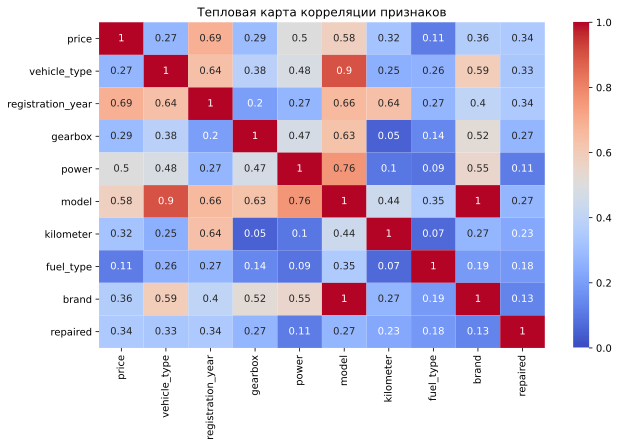

In [42]:
plt.figure(figsize=(10, 6))
sb.heatmap(df.phik_matrix(interval_cols=['price', 'power', 'kilometer'])
           .round(2), annot=True, vmin=0, vmax=1, cmap='coolwarm')
plot_describe('Тепловая карта корреляции признаков', '', '')

У столбцов 'brand' и 'model' коллинеарность практически 1, удалим один из них для удаления мультиколлинеарности:

In [43]:
df = df.drop('brand', axis=1)

В конце концов, так как мы удалили часть признаков, шанс пересечения схожих значений среди признаков оставшихся значительно возрос. Это может привести к возникновению новых дубликатов, которые только ухудшат результаты обучения модели, поэтому необходимо избавиться от них:

In [44]:
print(f'Количество дубликатов до обработки: {df.duplicated().sum()}')
df = df.drop_duplicates() # Избавляемся от дубликатов
print(f'Количество дубликатов после обработки: {df.duplicated().sum()}')

Количество дубликатов до обработки: 39841
Количество дубликатов после обработки: 0


Посмотрим, сколько данных осталось в итоге и от какого процента начального датасета пришлось избавиться:

In [45]:
LEN_DF_0 = 354369 # Количество строк в исходном датасете
print(f'Количество строк после предобработки: {len(df)}')
print(f'Потеряно строк от исходного датасета: {round((LEN_DF_0 - len(df)) / LEN_DF_0 * 100, 1)}%')

Количество строк после предобработки: 254664
Потеряно строк от исходного датасета: 28.1%


**Промежуточный вывод:**

На данном этапе мы отсеяли неинформативные признаки и, наконец, избавились от явных дубликатов. По итогу этого и предыдущего этапов была отсеяна практически четверть исходного датасета. 

## Обучение моделей

Для автоматизации машинного обучения (перебора вариантов масштабирования, выбора оптимальной модели и её гиперпараметров) в рамках данного анализа будем использовать пайплайны. Для кодирования категориальных признаков используем `OneHotEncoder` и `OrdinalEncoder`:

In [48]:
ohe_columns = ['vehicle_type', 'gearbox', 'model', 'fuel_type']
ord_columns = ['repaired']
num_columns = ['registration_year', 'power', 'kilometer']

y = df['price']
X = df.drop(['price'], axis = 1)
X_train, X_test, y_train, y_test = train_test_split(
    X, 
    y,
    test_size=TEST_SIZE,
    random_state=RANDOM_STATE
) 

In [52]:
ohe_pipe = Pipeline( # Cоздаём пайплайн для подготовки признаков из списка ohe_columns
   [  
        (
            'ohe', 
            OneHotEncoder(drop='first', handle_unknown='ignore')
        )
       
    ]
)   

ord_pipe = Pipeline( # Cоздаём пайплайн для подготовки признаков из списка ord_columns
    [
        (
            'ord',  
            OrdinalEncoder(
                categories=[
                    ['yes', 'no', 'unknown']
                ]
            )
        )
    ]
)
  
data_preprocessor = ColumnTransformer( # Cоздаём общий пайплайн для подготовки данных
    [
        ('ohe', ohe_pipe, ohe_columns),
        ('ord', ord_pipe, ord_columns)
    ], 
    remainder='passthrough'
)

pipe_final = Pipeline([ # Создаём итоговый пайплайн
    ('preprocessor', data_preprocessor),
    ('models', DecisionTreeRegressor(random_state=RANDOM_STATE))
])

pipe_final_2= Pipeline([
    ('models', LGBMRegressor(random_state=RANDOM_STATE))
])

Попробуем найти лучшие гиперпараметры для различных моделей

In [50]:
param_distributions = [
    {
        'models': [DecisionTreeRegressor(random_state=RANDOM_STATE)],
        'models__max_depth': [None] + [i for i in range(5, 10)],
        'models__min_samples_split': range(2, 10)
    }
]

In [53]:
randomized_search = RandomizedSearchCV(
    pipe_final, 
    param_distributions, 
    scoring='neg_root_mean_squared_error', 
    random_state=RANDOM_STATE,
    n_jobs=-1
)
randomized_search.fit(X_train, y_train)

/opt/conda/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:188: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:188: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:188: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:188: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:188: UserWarning: Found unknown categories

RandomizedSearchCV(estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ohe',
                                                                               Pipeline(steps=[('ohe',
                                                                                                OneHotEncoder(drop='first',
                                                                                                              handle_unknown='ignore'))]),
                                                                               ['vehicle_type',
                                                                                'gearbox',
                                                                                'model',
                                                                                'fuel_type']),
                                                                              ('ord',
                                                                               Pipeline(steps=[('ord',
                                                                                                OrdinalEncoder(categories=[['yes',
                                                                                                                            'no',
                                                                                                                            'unknown']]))]),
                                                                               ['repaired'])])),
                                             ('models',
                                              DecisionTreeRegressor(random_state=42))]),
                   n_jobs=-1,
                   param_distributions=[{'models': [DecisionTreeRegressor(min_samples_split=6,
                                                                          random_state=42)],
                                         'models__max_depth': [None, 5, 6, 7, 8,
                                                               9],
                                         'models__min_samples_split': range(2, 10)}],
                   random_state=42, scoring='neg_root_mean_squared_error')

In [54]:
randomized_search.best_score_ * (-1)

1951.2942004546353

In [55]:
param_distributions_2 = [
    {
        'models': [LGBMRegressor(random_state=RANDOM_STATE)],
        'models__n_estimators': [100, 200, 300],
        'models__max_depth': [3, 5, 7]
    }
] 

Преобразуем столбцы с категориальными переменными к типу 'category', что позволит более эффективно работать с этими признаками в дальнейшем, особенно когда модель, такая как LGBMRegressor, будет обучаться на этих признаках. Такое преобразование может потенциально повысить эффективность работы модели:

In [56]:
for i in ohe_columns:
    X_train.loc[:, i] = X_train[i].astype('category')
for i in ord_columns:
    X_train.loc[:, i] = X_train[i].astype('category')    

In [57]:
randomized_search_2 = RandomizedSearchCV( #LGBMRegressor
    pipe_final_2, 
    param_distributions_2, 
    scoring='neg_root_mean_squared_error', 
    random_state=RANDOM_STATE,
    n_jobs=-1,
)
randomized_search_2.fit(X_train, y_train)

/opt/conda/lib/python3.9/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


RandomizedSearchCV(estimator=Pipeline(steps=[('models',
                                              LGBMRegressor(random_state=42))]),
                   n_jobs=-1,
                   param_distributions=[{'models': [LGBMRegressor(max_depth=7,
                                                                  n_estimators=300,
                                                                  random_state=42)],
                                         'models__max_depth': [3, 5, 7],
                                         'models__n_estimators': [100, 200,
                                                                  300]}],
                   random_state=42, scoring='neg_root_mean_squared_error')

In [58]:
randomized_search_2.best_score_ * (-1)

1620.4303615502201

**Промежуточный вывод**:

В качестве моделей для рассмотрения мы выбрали и обучили модели DecisionTreeRegressor и LGBMRegressor. Значения целевой метрики RMSE для обоих моделей оказались ниже целевого показателя в 2500. 

## Анализ моделей

На этом этапе изучим время обучения, время предсказания и качество моделей DecisionTreeRegressor и LGBMRegressor с лучшими гиперпараметрами по итогам предыдущего этапа:

In [70]:
result = pd.DataFrame(randomized_search.cv_results_) # Выводим результаты для DecisionTreeRegressor
result = result.drop(result.columns[2: 6], axis=1)
result = result.drop(result.columns[3: 9], axis=1)
result

,mean_fit_time,std_fit_time,param_models,mean_test_score,std_test_score,rank_test_score
0,1.009385,0.017911,"DecisionTreeRegressor(min_samples_split=6, ran...",-2189.987127,10.357458,5
1,1.693339,0.025385,"DecisionTreeRegressor(min_samples_split=6, ran...",-2052.630354,9.637248,3
2,0.998314,0.025577,"DecisionTreeRegressor(min_samples_split=6, ran...",-2189.987127,10.357458,5
3,1.665934,0.022341,"DecisionTreeRegressor(min_samples_split=6, ran...",-2051.986397,9.798502,2
4,0.991933,0.010914,"DecisionTreeRegressor(min_samples_split=6, ran...",-2189.987127,10.357458,5
5,1.295866,0.020132,"DecisionTreeRegressor(min_samples_split=6, ran...",-2107.541490,13.355640,4
6,0.595268,0.011748,"DecisionTreeRegressor(min_samples_split=6, ran...",-2448.956348,4.551725,10
7,0.764444,0.016040,"DecisionTreeRegressor(min_samples_split=6, ran...",-2293.232250,7.485717,9
8,13.899273,0.124922,"DecisionTreeRegressor(min_samples_split=6, ran...",-1951.294200,10.243585,1
9,0.995890,0.022335,"DecisionTreeRegressor(min_samples_split=6, ran...",-2189.987127,10.357458,5


In [71]:
result_2 = pd.DataFrame(randomized_search_2.cv_results_) # Выводим результаты для LGBMRegressor
result_2 = result_2.drop(result_2.columns[2: 6], axis=1)
result_2 = result_2.drop(result_2.columns[3: 9], axis=1)
result_2

,mean_fit_time,std_fit_time,param_models,mean_test_score,std_test_score,rank_test_score
0,2.017977,0.205574,"LGBMRegressor(max_depth=7, n_estimators=300, r...",-1788.673223,2.483058,9
1,3.514436,0.118983,"LGBMRegressor(max_depth=7, n_estimators=300, r...",-1717.503399,3.743825,8
2,5.134394,0.363092,"LGBMRegressor(max_depth=7, n_estimators=300, r...",-1691.018457,3.870962,7
3,3.298353,0.276430,"LGBMRegressor(max_depth=7, n_estimators=300, r...",-1667.337297,3.401014,6
4,5.937241,0.471899,"LGBMRegressor(max_depth=7, n_estimators=300, r...",-1639.343241,3.388978,4
5,10.592489,3.672165,"LGBMRegressor(max_depth=7, n_estimators=300, r...",-1627.239130,4.411125,2
6,3.679309,0.214338,"LGBMRegressor(max_depth=7, n_estimators=300, r...",-1653.436194,2.755723,5
7,6.791577,0.464542,"LGBMRegressor(max_depth=7, n_estimators=300, r...",-1630.591480,5.450433,3
8,8.894824,0.330445,"LGBMRegressor(max_depth=7, n_estimators=300, r...",-1620.430362,6.001633,1


Что можно сказать по данным результатам:

- Лучший показатель метрики RMSE (1620) был достигнут на модели LGBMRegressor при времени обучения 8,9 с. Однако, с небольшим отставанием от него идёт та же модель, но с другими параметрами. Значение метрики на ней равно 1667 при времени обучения 3,3 с.
- Лучшая метрика RMSE модели DecisionTreeRegressor значительно хуже — 1951. К тому же, время обучения данной модели дольше на 5 секунд. Однако, параметры модели с данными показателями сложно назвать оптимальными — значение целевой метрики у модели справившейся чуть хуже хоть и равно 2051, однако время обучения составляет всего 1.6 с.

Как итог, можем порекомендовать заказчику выбрать модель LGBMRegressor с показателем 'rank_test_score' равным 6, так как эта модель лучше удовлетворяет требованиям заказчика. К тому же, отличия во времени обучения рассмотренных моделей незначительны, но точность предсказания данной модели ощутимо выше.

Остаётся протестировать модель на тестовых данных и найти время предсказания:

In [72]:
result_2.loc[result_2['rank_test_score'] == 6]['param_models'] # Найдём параметры модели

3    LGBMRegressor(max_depth=7, n_estimators=300, r...
Name: param_models, dtype: object

In [73]:
for i in ohe_columns:
    X_test.loc[:, i] = X_test[i].astype('category')
for i in ord_columns:
    X_test.loc[:, i] = X_test[i].astype('category')  

In [76]:
model_lgbm = Pipeline([
    ('model', LGBMRegressor(max_depth=7, n_estimators=300, random_state=42))
])
model_lgbm.fit(X_train, y_train)

Pipeline(steps=[('model',
                 LGBMRegressor(max_depth=7, n_estimators=300,
                               random_state=42))])

In [77]:
%%timeit # Выводим время предсказания модели на лучших гиперпараметрах
model_lgbm.predict(X_test)

1.87 s ± 36.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


**Промежуточный вывод:**

В качестве финальной модели, рекомендованной заказчику, была выбрана модель LGBMRegressor со следующими параметрами: max_depth = 7, n_estimators = 300. Время обучения данной модели — 3,3 секунды, время предсказания — 1,9 секунды.   

## Итоговый вывод

В ходе работы над проектом была выбрана наилучшая модель, которую мы можем порекомендовать заказчику. Ей стала модель **LGBMRegressor** время обучения которой составило 3,3 секунды, время предсказания — 1,9 секунды, показатель целевой метрики RMSE — 1667.

**Изначально в данных были следующие проблемы:**
- в данных было очень много пропусков;
- допущены стилистические ошибки в названиях столбцов;
- очевидные дубликаты в данных;
- возможны неочевидные дубликаты, требующие более тщательной проверки.

**В процессе исследовательского анализа и предобработки данных были:**
- Исправлены стилистические ошибки в названиях столбцов — все названия приведены к snake case.
- Обработаны пропущенные значения — заменили их заглушкой 'unknown'.
- Оптимизированы типы данных в столбцах.
- Не обнаружены неявные дубликаты.
- Удалены строки с аномальными значениями в столбцах с количественными признаками, изучены различия между категориальными признаками.
- Отсеяны неинформативные признаки.
- Удалены явные дубликаты. 

**Для автоматизации машинного обучения (перебора вариантов масштабирования, выбора оптимальной модели и её гиперпараметров) в рамках данного анализа были использованы пайплайны**. Лучшие модели, их параметры и значения рассчитанных на них метрик представлены выше.